# 1 - Importar depêndencias

In [2]:
!pip install unidecode
!python -m spacy download pt


#pd.set_option('display.max_colwidth', -1)

     |████████████████████████████████| 245kB 5.0MB/s 
     |████████████████████████████████| 12.9MB 794kB/s 
  Created wheel for pt-core-news-sm: filename=pt_core_news_sm-2.1.0-cp36-none-any.whl size=12843677 sha256=aec0678d2ca199c02647760113d00d3b4f25096daa528f7d27cfba5747c479d8
  Stored in directory: /tmp/pip-ephem-wheel-cache-5smiln2v/wheels/a3/8f/c1/f036e3a7f1aa44fb06a534c6c4b1c2b773f101fdb1f163c08c
Successfully built pt-core-news-sm
✔ Download and installation successful
You can now load the model via spacy.load('pt_core_news_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/pt_core_news_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/pt
You can now load the model via spacy.load('pt')


In [0]:
import pandas as pd
import unidecode as unidecode
import nltk as nltk
import string
import sklearn
from nltk import tokenize
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, mutual_info_classif, chi2, f_classif
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import numpy as np

In [22]:
nltk.download('rslp')
nltk.download('stopwords')

[nltk_data] Downloading package rslp to /root/nltk_data...
[nltk_data]   Unzipping stemmers/rslp.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

# Montar o datafrase

In [0]:
uri_data_civel = 'https://github.com/julianopacheco/classificacao-textos-juridicos/blob/master/arquivos/xls/civel.xlsx?raw=true'
df_civel = pd.read_excel(uri_data_civel, nrows=6000)#lendo somente 300 processos
df_civel['CLASSE'] = 0

In [0]:
uri_data_crime = 'https://github.com/julianopacheco/classificacao-textos-juridicos/blob/master/arquivos/xls/crime.xlsx?raw=true'
#uri_data_crime = 'https://github.com/julianopacheco/classificacao-textos-juridicos/blob/master/arquivos/xls/crime_cinco_registros.xlsx?raw=true'
df_crime = pd.read_excel(uri_data_crime, nrows=6000)#lendo somente 3000 processos
df_crime['CLASSE'] = 1

In [0]:
df = pd.concat([df_civel, df_crime], axis=0, ignore_index=True)
df = shuffle(df)

# 2 - Converte o campo a processar para uma lista de ementas

In [9]:
pd.set_option('display.max_colwidth', -1)
ementas = df['EMENTA'] # Lê a coluna EMENTA e passa para a variável ementas
y = df['CLASSE']	# Lê a coluna CLASSE do dataframe e passa para a variável y

ementas[:5]

1740     APELAÇÃO CÍVEL. AGRAVO RETIDO CONHECIDO. DEFEITO NA REPRESENTAÇÃO PROCESSUAL NÃO VERIFICADO. REJEITADAS AS PRELIMINARES DE ILEGITIMIDADE ATIVA DE PARTE E DE NULIDADE DA SENTENÇA. SEGUROS. AÇÃO DE COBRANÇA SECURITÁRIA. RECONHECIMENTO DO DEVER DA SEGURADORA DE INDENIZAR. SINISTRO OCORRIDO EM TERRITÓRIO ESTRANGEIRO. COBERTURA SECURITÁRIA DEVIDA. TRANSFERÊNCIA DOS SALVADOS.\r1. Não obstante o novo CPC não contemple mais o recurso de agravo retido (art. 994 do CPC) é possível seu conhecimento porque foi interposto e processado sob a égide do Código de Processo Civil/1973 e porque reiterada sua apreciação na apelação, nos moldes do artigo 523 do antigo CPC, assim como por força dos §§ 1º dos arts. 1.009 e 1.013 do CPC.\r2. Da análise das procurações acostadas às fls. 06-11, depreende-se que os instrumentos de mandato são plenamente válidos, conferindo poderes para os outorgados ingressarem com a presente demanda. Assim, preenchidos os pressupostos processuais relativos à capacidade 

# Pre-processamento

In [12]:
import string
   
def remove_caput(text):
        
    words = text.split()
    
    sem_caput = []
    for w in words:
        if not w.isupper():
            sem_caput.append(w)
    
    result = ''
    for w in sem_caput:
        result = result + w + ' '
    return result

dispositivos = ementas.apply(lambda x: remove_caput(x)) # verbetação + dispositivo
dispositivos.head(3)

1740     1. Não obstante o novo não contemple mais o recurso de agravo retido (art. 994 do é possível seu conhecimento porque foi interposto e processado sob a égide do Código de Processo Civil/1973 e porque reiterada sua apreciação na apelação, nos moldes do artigo 523 do antigo assim como por força dos §§ 1º dos arts. 1.009 e 1.013 do 2. Da análise das procurações acostadas às fls. 06-11, depreende-se que os instrumentos de mandato são plenamente válidos, conferindo poderes para os outorgados ingressarem com a presente demanda. Assim, preenchidos os pressupostos processuais relativos à capacidade postulatória dos autores, é de ser afastada a prefacial de defeito na representação processual dos autores e desprovido o agravo retido interposto pela requerida. 3. No mesmo sentido, a preliminar de ilegitimidade ativa dos autores Fabiano, Andrei e Márcia não merece trânsito. Com efeito, analisando-se os documentos juntados as fls. 38-59, infere-se que os requisitos legais referentes à cess

In [0]:
df['DISPOSITIVOS'] = dispositivos

In [15]:
df['DISPOSITIVOS'].head(3)

1740     1. Não obstante o novo não contemple mais o recurso de agravo retido (art. 994 do é possível seu conhecimento porque foi interposto e processado sob a égide do Código de Processo Civil/1973 e porque reiterada sua apreciação na apelação, nos moldes do artigo 523 do antigo assim como por força dos §§ 1º dos arts. 1.009 e 1.013 do 2. Da análise das procurações acostadas às fls. 06-11, depreende-se que os instrumentos de mandato são plenamente válidos, conferindo poderes para os outorgados ingressarem com a presente demanda. Assim, preenchidos os pressupostos processuais relativos à capacidade postulatória dos autores, é de ser afastada a prefacial de defeito na representação processual dos autores e desprovido o agravo retido interposto pela requerida. 3. No mesmo sentido, a preliminar de ilegitimidade ativa dos autores Fabiano, Andrei e Márcia não merece trânsito. Com efeito, analisando-se os documentos juntados as fls. 38-59, infere-se que os requisitos legais referentes à cess

In [0]:
def remover_stopwords_e_aplicar_stemmer(tokenizador, textos):
  stop_words = nltk.corpus.stopwords.words("portuguese")
  ementas_processadas = list()
  for ementa in textos:
    nova_ementa = list()
    print(ementa)
    palavras_ementa = tokenizador.tokenize(ementa)
    print(palavras_ementa)
    for palavra in palavras_ementa:
      if palavra.lower() not in stop_words:
        #nova_ementa.append(stemmer.stem(palavra))
        nova_ementa.append(palavra)
    ementas_processadas.append(' '.join(nova_ementa))
  return ementas_processadas

In [0]:
dispostivos_proc = [unidecode.unidecode(texto.lower()) for texto in df["DISPOSITIVOS"]]
df["DISPOSITIVOS_PROC"] = dispostivos_proc

In [0]:
stemmer = nltk.RSLPStemmer()
punct_tokenize = tokenize.WordPunctTokenizer()

In [25]:
df['DISPOSITIVOS_PROC'] = remover_stopwords_e_aplicar_stemmer(punct_tokenize, df["DISPOSITIVOS_PROC"])

1. nao obstante o novo nao contemple mais o recurso de agravo retido (art. 994 do e possivel seu conhecimento porque foi interposto e processado sob a egide do codigo de processo civil/1973 e porque reiterada sua apreciacao na apelacao, nos moldes do artigo 523 do antigo assim como por forca dos SSSS 1o dos arts. 1.009 e 1.013 do 2. da analise das procuracoes acostadas as fls. 06-11, depreende-se que os instrumentos de mandato sao plenamente validos, conferindo poderes para os outorgados ingressarem com a presente demanda. assim, preenchidos os pressupostos processuais relativos a capacidade postulatoria dos autores, e de ser afastada a prefacial de defeito na representacao processual dos autores e desprovido o agravo retido interposto pela requerida. 3. no mesmo sentido, a preliminar de ilegitimidade ativa dos autores fabiano, andrei e marcia nao merece transito. com efeito, analisando-se os documentos juntados as fls. 38-59, infere-se que os requisitos legais referentes a cessao de d

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['33', ',', 'no', '11', '.', '343', '/', '06', ',', 'despeito', 'da', 'ausencia', 'de', 'citacao', 'pessoal', 'do', 'reu', ',', 'verifica', '-', 'se', 'que', ',', 'na', 'audiencia', 'do', 'dia', 'ocasiao', 'em', 'que', 'foram', 'ouvidas', 'duas', 'testemunhas', 'de', 'acusacao', ',', 'tiago', 'foi', 'assistido', 'por', 'defensor', 'publico', ',', 'que', 'acompanhou', 'a', 'producao', 'da', 'prova', 'testemunhal', 'e', 'formulou', 'questionamentos', ',', 'nao', 'havendo', 'duvidas', 'de', 'que', 'os', 'principios', 'da', 'ampla', 'defesa', 'e', 'do', 'contraditorio', 'foram', 'devidamente', 'observados', ',', 'circunstancia', 'que', 'afasta', 'a', 'alegada', 'nulidade', '.', 'precedente', '.', 'afora', 'isso', ',', 'o', 'reu', 'foi', 'posteriormente', 'requisitado', 'e', 'interrogado', ',', 'oportunidade', 'em', 'que', 'apresentou', 'a', 'sua', 'autodefesa', ',', 'nao', 'tendo', 'a', 'defesa', 'levantado', ',', 'na', 'oportunidade', ',', 'qualquer', 'objecao', 'quanto', 'ao', 'fato', 'd

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



no que se refere ao pedido de trancamento da acao penal originaria em face da incompetencia absoluta da justica estadual para conhecer, processar e julgar o processo-crime de origem, de anotar que um dos fatos imputados ao paciente no feito de origem consiste em conversao de valores obtidos ilegalmente em moeda estrangeira. contudo, tal fato, de forma isolada, nao implica necessariamente em lesao a interesse da uniao, caracterizador do deslocamento da competencia para a justica federal. isso porque, ao que tudo indica, o prejuizo gerado pela acao imputada ao paciente causaria prejuizos diretamente apenas a particulares. de outro lado, os crimes antecedentes a lavagem de dinheiro denunciada tratam-se de estelionatos, de competencia da justica estadual. precedente do assim, em principio, nao se esta diante de crimes da competencia da justica federal no caso. de qualquer forma, o impetrante junta aos autos apenas copia da denuncia, o que inviabiliza analise aprofundada da questao, que, ad

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




33 SS 4o, no 11.343/06). materialidade delitiva encontra-se consubstanciada nos autos. em relacao a autoria, o reu, em ambas as oportunidades em que foi ouvido, negou o cometimento do crime. versao apresentada pelo reu, contudo, foi confrontada pelos testemunhos unissonos e coerentes dos agentes publicos, os quais confirmaram que o reu, em fuga, dispensou o entorpecente apreendido. quanto a validade dos depoimentos dos policiais, saliento que os mesmos devem ser considerados aptos para sustentar a condenacao, ainda mais quando forem unissonos, nao existindo qualquer indicio que possa desabonar os seus testemunhos. precedente. alegacao de eventual enxerto dos entorpecentes e tese que se esvazia, uma vez que nao se demonstrou que os agentes publicos fossem desafetos do acusado ou por algum motivo desejassem lhe prejudicar. nao ha duvidas de que a droga apreendida pertencia ao reu, sobretudo a partir das declaracoes harmonicas e coerentes dos policiais, que deste a fase extrajudicial, ap

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



157, SS 2o, 1o 2o 1. comprovada a existencia do primeiro fato narrado na denuncia e recaindo a autoria sobre a pessoa do acusado, impositiva a manutencao da condenacao. reconhecimento do reu, realizado em ambas as fases pela vitima do primeiro roubo, restou corroborado pelos demais elementos de prova. ainda que nao tenha sido estritamente observado o disposto no artigo 226 do tal circunstancia nao tem o condao de configurar qualquer vicio no ato de reconhecimento, ou a invalidade deste. 2. majorantes mantidas. uso de arma de fogo restou devidamente comprovado, de forma inequivoca, nos autos, razao pela qual impossivel acolher o pedido de afastamento. dispensavel a apreensao e a realizacao de pericia para que incida a majorante em questao. alem disso, comprovado que o primeiro fato foi praticado pelo reu juntamente com outro individuo nao identificado, mantida a incidencia da majorante do concurso de pessoas. desnecessidade de demonstracao do previo ajuste de vontades entre os agentes p

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['1', '.', 'oitiva', 'de', 'testemunha', 'sem', 'a', 'presenca', 'do', 'detento', 'e', '/', 'ou', 'seu', 'defensor', 'nao', 'implica', 'ofensa', 'aos', 'principios', 'do', 'contraditorio', 'e', 'da', 'ampla', 'defesa', ',', 'nao', 'se', 'havendo', 'pretender', 'judicializar', 'procedimento', 'meramente', 'administrativo', 'para', 'apuracao', 'de', 'falta', 'disciplinar', '.', 'precedentes', 'deste', 'orgao', 'fracionario', 'e', 'do', 'se', 'ouvido', ',', 'o', 'apenado', ',', 'na', 'presenca', 'do', 'defensor', ',', 'tanto', 'no', 'quanto', 'em', 'juizo', ',', 'como', 'no', 'caso', ',', 'nao', 'ha', 'falar', 'em', 'nulidade', ',', 'porquanto', 'preservados', 'os', 'principios', 'do', 'contraditorio', 'e', 'da', 'ampla', 'defesa', '.', 'independencia', 'entre', 'as', 'esferas', 'administrativa', 'e', 'judicial', ',', 'podendo', 'um', 'ato', 'repercutir', 'em', 'ambas', ',', 'sem', 'bis', 'in', 'idem', ',', 'eventual', 'eiva', 'na', 'primeira', 'fase', 'procedimental', 'nao', 'obstando',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Geração do bag of words

In [0]:
count_vectorizer = CountVectorizer()

In [0]:
bag_of_words = count_vectorizer.fit_transform(df['DISPOSITIVOS_PROC'])

In [0]:
random_state_seed = 42

# Quebrando o conjunto de treino e teste

In [0]:
X_treino, X_teste, y_treino, y_teste = train_test_split(bag_of_words,
                                                              df.CLASSE,
                                                              test_size=0.2,
                                                              random_state = random_state_seed)

# Modelos

In [0]:
#MultinomialNB
nb = MultinomialNB()

#SVM (Linear):
#=============
svm = SVC(kernel='linear', probability=True)

#DecisionTreeClassifier (DT-CART)
#======================
dtre = DecisionTreeClassifier(max_depth=5)

#Random Forest:
#==============
rf = RandomForestClassifier(n_estimators=40)

#Logistic Regression:
#========================
#lr = LogisticRegression(solver='lbfgs')
lr = LogisticRegression(solver='lbfgs', multi_class='auto',)

#KNN ( KNeighborsClassifier )
neigh = KNeighborsClassifier(n_neighbors=5)

models = [nb,dtre,rf,lr,neigh,svm] 
names = ['NB', 'Descision Tree','Random Florest', 'Logistic Regression', 'KNeighborsClassifier', 'SVM - Linear']

# Classificação

In [0]:
def executa_algoritmos(X_treino, y_treino, X_teste, y_teste, bag_of_words, models):
  
  for model in models:
    
    print(model)
    model.fit(X_treino,y_treino)
    #print(" Score : ", model.score(X_treino,y_treino))
    y_pred_class =  model.predict(X_teste)
    print(" Accuracy: ", accuracy_score(y_teste, y_pred_class))
    print(" Recall : ",recall_score(y_teste, y_pred_class, average='macro'))
    print(" Precision : ",precision_score(y_teste, y_pred_class, average='macro'))
    print(" f1 socre : ", f1_score(y_teste, y_pred_class, average='macro'))

    target_names = ['CIVIL', 'CRIME']
    print(classification_report(y_teste, y_pred_class, target_names=target_names))
    print("----------------------------------------------------------------------")

  seed = random_state_seed
  # prepare models
  models = []
  models.append(('NB.', nb))
  models.append(('Decision T.', dtre))
  models.append(('RF', rf))
  models.append(('LR', lr))
  models.append(('KNN', neigh))
  models.append(('SVM', svm))
 
  # evaluate each model in turn
  results = []
  names = []
  scoring = 'accuracy'
  for name, model in models:
    kfold = model_selection.KFold(n_splits=10, random_state=seed)
    cv_results = model_selection.cross_val_score(model, bag_of_words, 
                                                 y, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
  # boxplot algorithm comparison
  fig = plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
  fig.suptitle('Comparação dos algoritmos')
  #plt.xticks(np.arange(10,30,50,60,80,90,95, 98, 1.00))
  ax = fig.add_subplot(111)
  plt.boxplot(results)
  ax.set_xticklabels(names)
  plt.show()

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
 Accuracy:  0.9820833333333333
 Recall :  0.9821686579605446
 Precision :  0.9820511253507932
 f1 socre :  0.9820810654681816
              precision    recall  f1-score   support

       CIVIL       0.99      0.98      0.98      1220
       CRIME       0.98      0.99      0.98      1180

    accuracy                           0.98      2400
   macro avg       0.98      0.98      0.98      2400
weighted avg       0.98      0.98      0.98      2400

----------------------------------------------------------------------
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
 Accuracy:  0.9

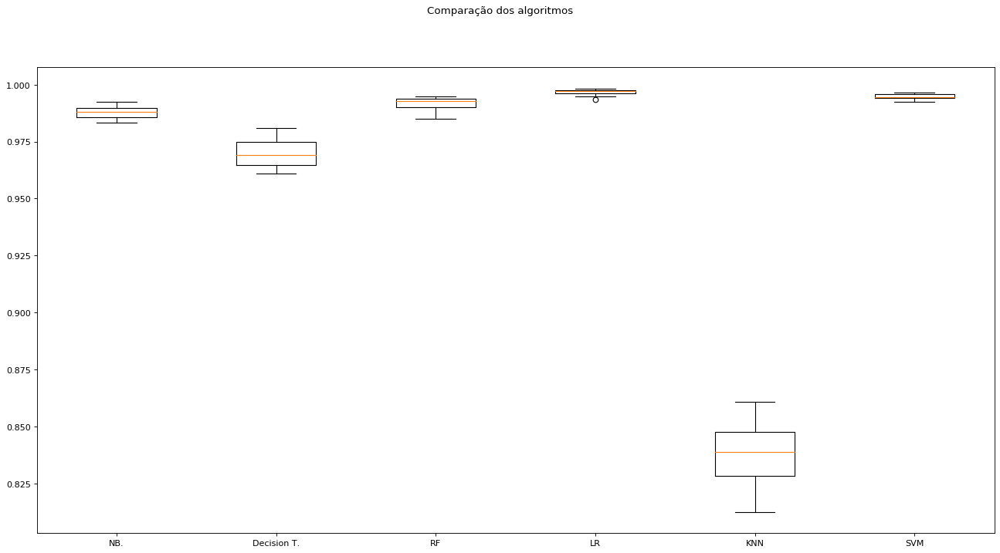

In [43]:
executa_algoritmos(X_treino, y_treino, X_teste, y_teste, bag_of_words, models)

# Curva de aprendizado

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


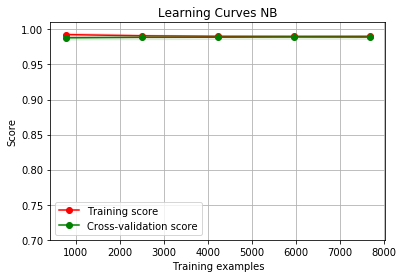

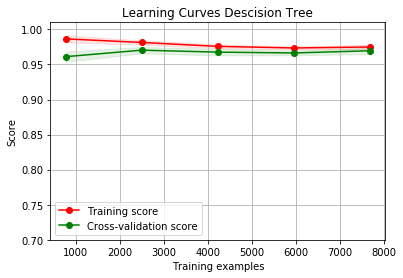

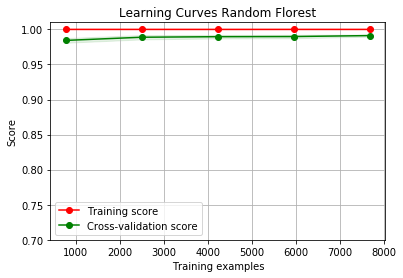

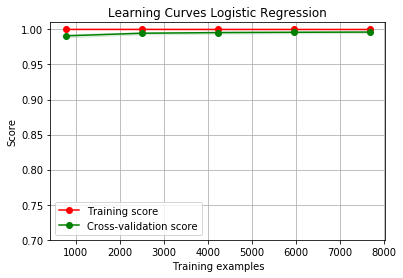

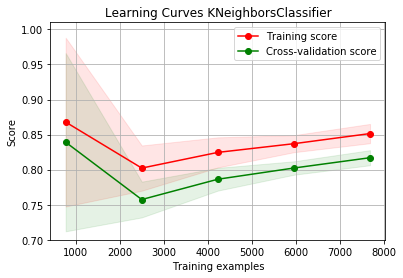

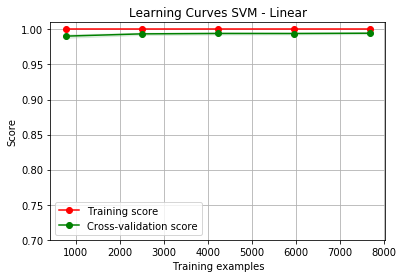

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.datasets import load_digits
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit


def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
   
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt


for model, name in zip(models,names) :

  title = "Learning Curves " + name
  
  # Cross validation with 100 iterations to get smoother mean test and train
  # score curves, each time with 20% data randomly selected as a validation set.
  
  cv = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
  plot_learning_curve(model, title, X_treino, y_treino, ylim=(0.7, 1.01), cv=cv, n_jobs=4)


plt.show()

# Matriz de confusão

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)_modelo
Confusion matrix, without normalization
[[1192   28]
 [  15 1165]]


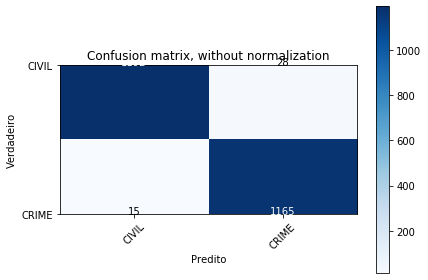

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')_modelo
Confusion matrix, without normalization
[[1172   48]
 [  37 1143]]


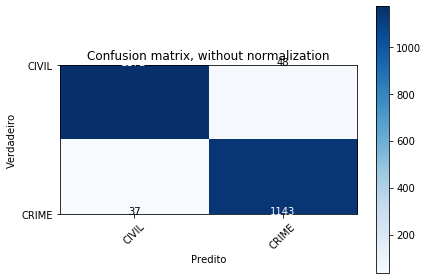

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)_modelo
Confusion matrix, without normalization
[[1202   18]
 [   9 1171]]


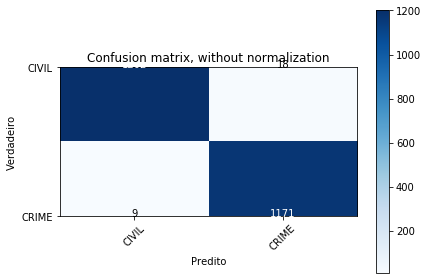

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)_modelo
Confusion matrix, without normalization
[[1218    2]
 [  11 1169]]


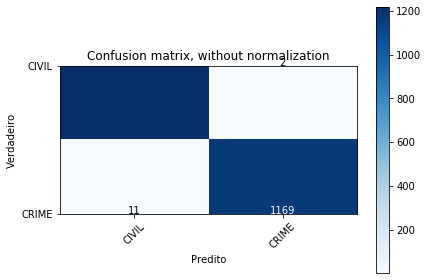

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')_modelo
Confusion matrix, without normalization
[[1220    0]
 [ 407  773]]


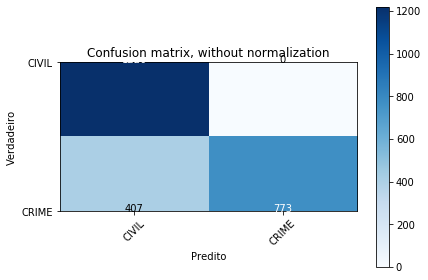

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=True, random_state=None,
    shrinking=True, tol=0.001, verbose=False)_modelo
Confusion matrix, without normalization
[[1216    4]
 [  11 1169]]


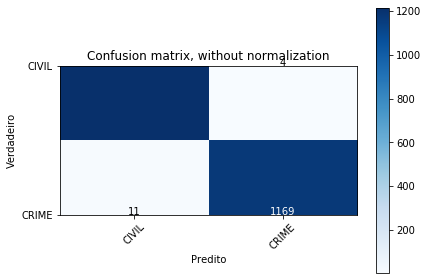

In [45]:
import itertools  
from sklearn.metrics import confusion_matrix

class_names = ['CIVIL', 'CRIME']

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Verdadeiro')
    plt.xlabel('Predito')

for model in models:

    y_pred = model.predict(X_teste)    
    
    print(str(model)+'_modelo')
    # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_teste, y_pred)
    np.set_printoptions(precision=2)

    # Plot non-normalized confusion matrix
    plt.figure()
    plot_confusion_matrix(cnf_matrix, classes=class_names,
                          title='Confusion matrix, without normalization')

    # Plot normalized confusion matrix
    #plt.figure()
    #plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
    #                      title='Normalized confusion matrix')

    plt.show()